In [6]:
import numpy as np
import pandas as pd
import functions as fnc
import glob
import os
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import matplotlib.patches as patches
from torchvision.ops.boxes import batched_nms
from importlib import reload
import cv2

from sklearn.neighbors import KDTree
import matplotlib.colors as mcolors
from skimage.measure import label, regionprops
import torch
from skimage.color import label2rgb
from skimage.segmentation import clear_border
from skimage.morphology import binary_dilation

import clip
from tqdm import tqdm
from PIL import Image

from segment_anything import sam_model_registry, SamPredictor
import json



In [8]:
downsampled=False
OutDIR= '/DATA/vito/output/Sand2_4096_run_dw1_cp512/'

with open(OutDIR+'init_para.json', 'r') as json_file:
      init_para = json.load(json_file)

resample_factor=init_para.get('resample_factor')
with open(OutDIR+'pre_para.json', 'r') as json_file:
      pre_para = json.load(json_file)

OutDIR=init_para.get('OutDIR')
DataDIR=init_para.get('DataDIR')
DSname=init_para.get('DatasetName')
fid=init_para.get('fid')
crop_size=init_para.get('crop_size')
resample_factor=init_para.get('resample_factor')

image=fnc.load_image(DataDIR,DSname,fid)
print('Image size:', image.shape)
image=fnc.preprocessing_roulette(image, pre_para)
all_reseg=np.load(OutDIR+'all_mask_merged_windows_id.npy', allow_pickle=True)

Sand2_35_50mm_orthomosaic_03mm_rectangle_clip2_4096.tif imported
Image size: (4096, 4096, 3)
Not downsampling


In [9]:
ar_masks=np.array(all_reseg)

In [10]:
#setup SAM
MODEL_TYPE = "vit_h"
if torch.cuda.is_available():
    DEVICE = torch.device('cuda:0')
    print('Currently running on GPU\nModel '+MODEL_TYPE)
else:
    DEVICE = torch.device('cpu')
    print('Currently running on CPU\nModel '+MODEL_TYPE)

if MODEL_TYPE == 'vit_h':
    CHECKPOINT_PATH = DataDIR+'MetaSAM/sam_vit_h_4b8939.pth'
elif MODEL_TYPE == 'vit_l':
    CHECKPOINT_PATH = DataDIR+'MetaSAM/sam_vit_l_0b3195.pth'
else:
    CHECKPOINT_PATH = DataDIR+'MetaSAM/sam_vit_b_01ec64.pth'

sam = sam_model_registry[MODEL_TYPE](checkpoint=CHECKPOINT_PATH)
sam.to(device=DEVICE)
predictor = SamPredictor(sam)
predictor.set_image(image)

Currently running on GPU
Model vit_h


In [4]:
#OutDIR='/DATA/vito/output/overlap_highestIOU_reseg_edgenobuffer_downsampled2/'
#downsampled=True
#OutDIR='/DATA/vito/output/overlap_highestIOU_reseg_edgenobuffer_2/'
OutDIR='/DATA/vito/output/testing/'
downsampled=False

DataDIR='/DATA/vito/data/'
#fn_img = glob.glob(DataDIR+'test_img/*')
fn_img = glob.glob(DataDIR+'drone_ortho/*')
fn_img.sort()

image=(np.load(DataDIR+'example/rgb.npy')*255).astype(np.uint8)
#image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
seg_ids=np.load(DataDIR+'example/segment_ids.npy')

if downsampled:
    pre_para={'Downsample': {'fxy':0.5}}
    image=fnc.preprocessing_roulette(image, pre_para)
    pre_para={'Downsample': {'fxy':0.5, 'method':'nearest'}}
    seg_ids=fnc.preprocessing_roulette(seg_ids, pre_para)

all_reseg=np.load(OutDIR+'all_reseg_mask.npy', allow_pickle=True)

In [5]:
Aggregate_masks_noedge=[]
pred_iou_noedge=[]
crop_size=1024
for clip_window in all_reseg:
    i=clip_window['i']
    j=clip_window['j']
    #print(i,j)
    for mask,score in zip(clip_window['mask'], clip_window['mask pred iou']):
        if not (np.any(mask[0]==1) or np.any(mask[-1]==1) or np.any(mask[:,0]==1) or np.any(mask[:,-1]==1)):
            resize=np.zeros(image.shape[:-1])
            Valid_area=resize[int(crop_size*i):int(crop_size*i+crop_size),int(crop_size*j):int(crop_size*j+crop_size)].shape
            if Valid_area==(crop_size,crop_size):
                resize[int(crop_size*i):int(crop_size*i+crop_size),int(crop_size*j):int(crop_size*j+crop_size)]=mask
            else:
                resize[int(crop_size*i):int(crop_size*i+crop_size),int(crop_size*j):int(crop_size*j+crop_size)]=mask[:Valid_area[0],:Valid_area[1]]
            Aggregate_masks_noedge.append(resize)
            pred_iou_noedge.append(score)

In [6]:
bboxes = torch.tensor([fnc.find_bounding_boxes(mask) for mask in Aggregate_masks_noedge], device=DEVICE, dtype=torch.float)
scores = torch.tensor(pred_iou_noedge, device=DEVICE, dtype=torch.float)
labels = torch.zeros_like(bboxes[:, 0])

In [7]:
keep = batched_nms(bboxes, scores, labels, 0.35)#was 0.3
Aggregate_masks_noedge_nms=[Aggregate_masks_noedge[i] for i in keep]
#pred_iou_noedge_nms=[pred_iou_noedge[i] for i in keep]
len(Aggregate_masks_noedge_nms)

379

In [8]:
stacked_Aggregate_masks_noedge_nms=np.sum(Aggregate_masks_noedge_nms,axis=0)

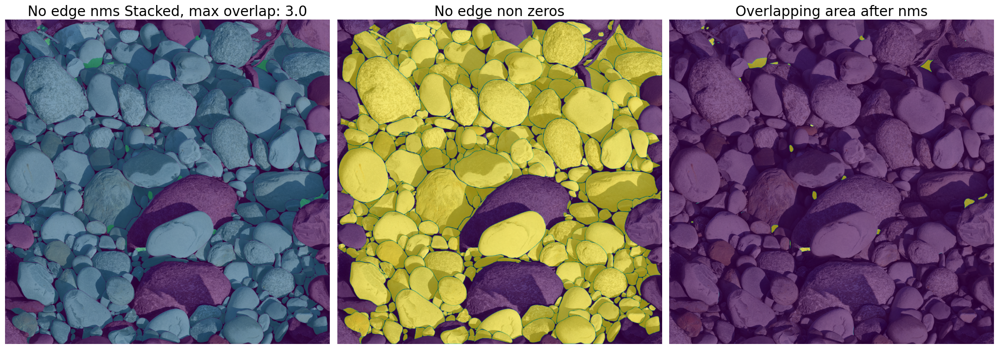

In [9]:
plt.figure(figsize=(20,15))
plt.subplot(1,3,1)
plt.imshow(image)
plt.imshow(stacked_Aggregate_masks_noedge_nms,alpha=0.6)
plt.axis('off')
plt.title(f'No edge nms Stacked, max overlap: {np.max(stacked_Aggregate_masks_noedge_nms)}', fontsize=20)
plt.subplot(1,3,2)
plt.imshow(image)
plt.imshow(stacked_Aggregate_masks_noedge_nms!=0,alpha=0.6)
plt.axis('off')
plt.title('No edge non zeros', fontsize=20)
plt.subplot(1,3,3)
plt.imshow(image)
plt.imshow(stacked_Aggregate_masks_noedge_nms>1,alpha=0.6)
plt.axis('off')
plt.title('Overlapping area after nms', fontsize=20)
plt.tight_layout()
plt.show()

In [10]:
#clear RAM
del bboxes,scores,labels,keep
del Aggregate_masks_noedge, pred_iou_noedge

In [11]:
list_of_mask_centroid = [fnc.get_centroid(mask) for mask in Aggregate_masks_noedge_nms]
ar_masks=np.stack(Aggregate_masks_noedge_nms)
del Aggregate_masks_noedge_nms

In [12]:
#ar_masks=np.load(OutDIR+'Aggregate_masks_noedge_nms.npy')
#ar_masks.shape

In [16]:
ar_masks=np.stack([mask['mask'] for mask in all_reseg])

In [11]:
dilation_size=31
kernel = np.ones((dilation_size, dilation_size), np.uint8)
stacked_Aggregate_masks_noedge_nms_eroded=binary_dilation(ar_masks>=1, kernel)
 
#stacked_Aggregate_masks_noedge_nms_eroded = cv2.dilate(stacked_Aggregate_masks_noedge_nms==1, kernel, iterations=1) 
no_mask_area=label(stacked_Aggregate_masks_noedge_nms_eroded,1,False,1)

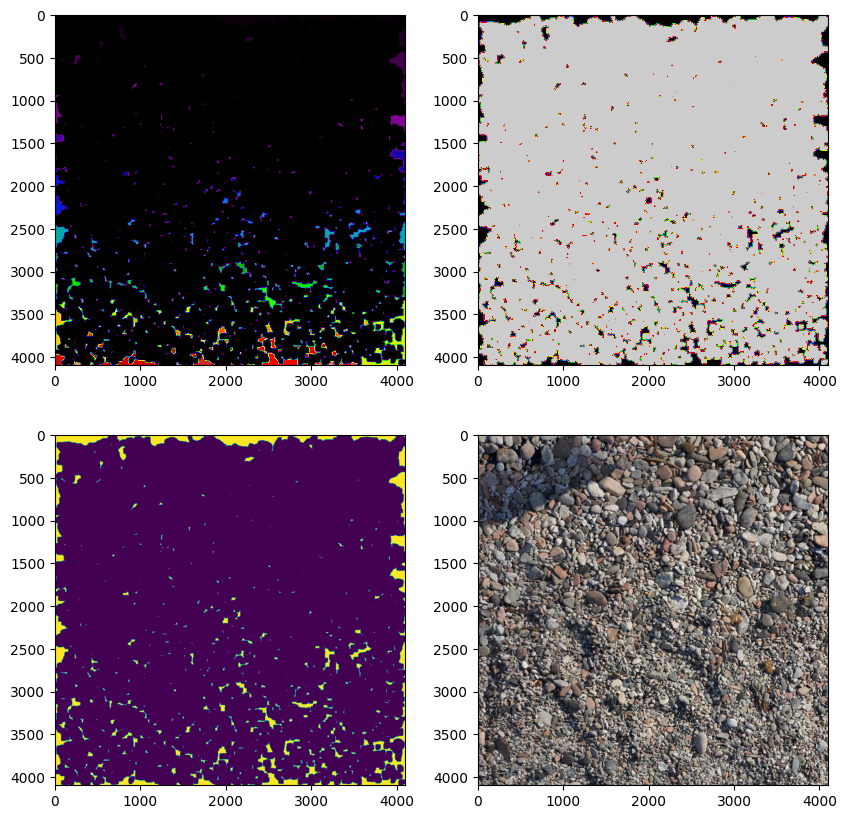

In [12]:
plt.figure(figsize=(10,10))
plt.subplot(2,2,1)
plt.imshow(no_mask_area, cmap='nipy_spectral')
plt.subplot(2,2,2)
plt.imshow(stacked_Aggregate_masks_noedge_nms_eroded, cmap='nipy_spectral')
plt.subplot(2,2,3)
plt.imshow(stacked_Aggregate_masks_noedge_nms_eroded==0)
plt.subplot(2,2,4)
plt.imshow(image)

In [ ]:
void_pointed_reseg=[]
for i in range(ar_no_mask_area.shape[0]):
    y0, x0 =list_of_no_mask_area_centroid[i]
    input_point = np.array([[int(x0*fxy-xmin),int(y0*fxy-ymin)]])
    input_label = np.array([1])

    partmasks, scores, logits = predictor.predict(
        point_coords=input_point,
        point_labels=input_label,
        multimask_output=True,)
    best_idx=np.argmax(scores)#pick the mask with highest score
    void_pointed_reseg.append(partmasks[best_idx])

In [20]:
min_void_size=image.shape[0]*image.shape[1]*0.001

regions=regionprops(no_mask_area)

list_of_no_mask_area_centroid=[]
list_of_no_mask_area_mask=[]
list_of_no_mask_area_bbox=[]
for i,region in enumerate(regions):
    # take regions with large enough areas
    if (region.area > min_void_size):
        mask=np.array(no_mask_area==(i+1))
        #if not (np.any(mask[0]==1) or np.any(mask[-1]==1) or np.any(mask[:,0]==1) or np.any(mask[:,-1]==1)):
        y0, x0 =region.centroid
        minr, minc, maxr, maxc = region.bbox
        bx = (minc, maxc, maxc, minc, minc)
        by = (minr, minr, maxr, maxr, minr)

        list_of_no_mask_area_centroid.append((y0,x0))
        list_of_no_mask_area_mask.append(no_mask_area==(i+1))
        list_of_no_mask_area_bbox.append([bx,by])


7 void(s) found
Void 0 width: 3676 length: 3362
Downsampled by factor of 4 required
Void 1 width: 449 length: 223
Downsample not necessary
Void 2 width: 466 length: 366
Downsample not necessary
Void 3 width: 649 length: 585
Downsample not necessary
Void 4 width: 168 length: 428
Downsample not necessary
Void 5 width: 376 length: 224
Downsample not necessary
Void 6 width: 245 length: 177
Downsample not necessary


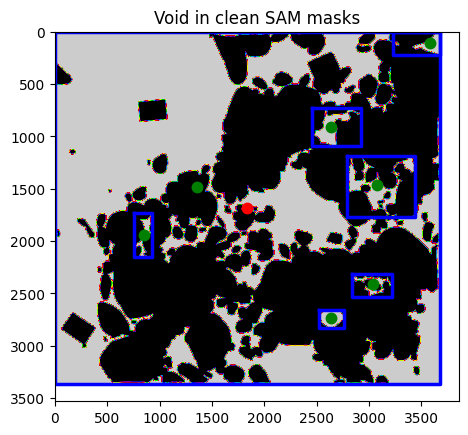

Downsampled by factor of 4 required for all voids to fit in one go
Single downsample window can fit all voids but on average requires more downsampling


In [21]:
if len(list_of_no_mask_area_mask)>0:
    print(f'{len(list_of_no_mask_area_mask)} void(s) found')
    ar_no_mask_area=np.stack(list_of_no_mask_area_mask)

    plt.imshow(np.sum(ar_no_mask_area,axis=0), cmap='nipy_spectral')
    reseg_fxy=[]
    bxmax=0
    bxmin=9999
    bymax=0
    bymin=9999
    for i in range(ar_no_mask_area.shape[0]):
        y0, x0 =list_of_no_mask_area_centroid[i]
        bx, by =list_of_no_mask_area_bbox[i]
        if np.max(bx)>bxmax:
            bxmax=np.max(bx)
        if np.min(bx)<bxmin:
            bxmin=np.min(bx)
        if np.max(by)>bymax:
            bymax=np.max(by)
        if np.min(by)<bymin:
            bymin=np.min(by)

        plt.plot(x0, y0, '.g', markersize=15)
        plt.plot(bx, by, '-b', linewidth=2.5)
        width, length=np.max(bx)-np.min(bx),np.max(by)-np.min(by)
        print(f'Void {i} width: {width} length: {length}')
        if ((np.max([width,length])*0.9)<=crop_size):
            print(f'Downsample not necessary')
            reseg_fxy.append(1)
        else:
            factor=int((np.max([length,width])*0.9)//crop_size)+1
            print(f'Downsampled by factor of {factor} required')
            reseg_fxy.append(factor)
    plt.title('Void in clean SAM masks')

    Big_width=bxmax-bxmin
    Big_length=bymax-bymin
    all_void_x0=bxmin+Big_width/2
    all_void_y0=bymin+Big_length/2
    plt.plot(all_void_x0, all_void_y0, '.r', markersize=15)
    plt.savefig(OutDIR+'void.png')
    plt.show()

    if ((np.max([Big_width,Big_length])*0.9)<=crop_size):
        print(f'Downsample not necessary for all voids to fit in one go')
        reseg_fxy.append(1)
    else:
        factor=int((np.max([Big_length,Big_width])*0.9)//crop_size)+1
        print(f'Downsampled by factor of {factor} required for all voids to fit in one go')
        reseg_fxy.append(factor)

    if reseg_fxy[-1]<4:#if level of downsampling is small
        if reseg_fxy[-1]<=np.max(reseg_fxy[:-1]):
            print(f'Single downsample window can fit all voids, downsample by factor of {reseg_fxy[-1]}')
            onego=True
        else:
            onego=False
            print(f'Single downsample window cannot fit all voids or requires higher degree of downsampling')
    else:
        if reseg_fxy[-1]<=np.mean(reseg_fxy[:-1]):
            print(f'Single downsample window can fit all voids, downsample by factor of {reseg_fxy[-1]} required and on average requires less downsampling')
            onego=True
        else:
            print(f'Single downsample window can fit all voids but on average requires more downsampling')
            onego=False

In [17]:
#try num of voids-i combinations if windows can fit
import itertools
pairs=np.arange(0,len(list_of_no_mask_area_bbox))
i=len(list_of_no_mask_area_bbox)-1
while i>1:
    combinations = list(itertools.combinations(pairs, i))

    # Print the combinations
    for combination in combinations:
        print(combination)

In [18]:
#fill in holes with downsampled segmentation

fxy=1/reseg_fxy[-1]
pre_para={'Downsample': {'fxy':fxy}}
image_dw=fnc.preprocessing_roulette(image, pre_para)

#define the window
xmin,xmax=all_void_x0*fxy-512,all_void_x0*fxy+512
ymin,ymax=all_void_y0*fxy-512,all_void_y0*fxy+512


In [19]:
ji=xmin/1024
ii=ymin/1024

#prepare image
pre_para={'Downsample': {'fxy':fxy},
          'Crop': {'crop size': crop_size, 'j':ji,'i':ii},
          'Gaussian': {'kernel size':3}
          # #'CLAHE':{'clip limit':2}#
          # #'Downsample': {'fxy':4},
          # #'Buffering': {'crop size': crop_size}
            }
temp_image=fnc.preprocessing_roulette(image, pre_para)

Cropped from (1500, 1500, 3) to (956, 1024, 3)


In [20]:
#setup SAM
MODEL_TYPE = "vit_h"
if torch.cuda.is_available():
    DEVICE = torch.device('cuda:0')
    print('Currently running on GPU\nModel '+MODEL_TYPE)
else:
    DEVICE = torch.device('cpu')
    print('Currently running on CPU\nModel '+MODEL_TYPE)

if MODEL_TYPE == 'vit_h':
    CHECKPOINT_PATH = DataDIR+'MetaSAM/sam_vit_h_4b8939.pth'
elif MODEL_TYPE == 'vit_l':
    CHECKPOINT_PATH = DataDIR+'MetaSAM/sam_vit_l_0b3195.pth'
else:
    CHECKPOINT_PATH = DataDIR+'MetaSAM/sam_vit_b_01ec64.pth'

sam = sam_model_registry[MODEL_TYPE](checkpoint=CHECKPOINT_PATH)
sam.to(device=DEVICE)
predictor = SamPredictor(sam)
predictor.set_image(temp_image)

Currently running on GPU
Model vit_h


In [21]:
void_pointed_reseg=[]
for i in range(ar_no_mask_area.shape[0]):
    y0, x0 =list_of_no_mask_area_centroid[i]
    input_point = np.array([[int(x0*fxy-xmin),int(y0*fxy-ymin)]])
    input_label = np.array([1])

    partmasks, scores, logits = predictor.predict(
        point_coords=input_point,
        point_labels=input_label,
        multimask_output=True,)
    best_idx=np.argmax(scores)#pick the mask with highest score
    void_pointed_reseg.append(partmasks[best_idx])

In [22]:
void_pointed_reseg_resized=[]
crop_size=1024

for mask in void_pointed_reseg:
    if not (np.any(mask[0]==1) or np.any(mask[-1]==1) or np.any(mask[:,0]==1) or np.any(mask[:,-1]==1)):
        resize=np.zeros(image_dw.shape[:-1])
        Valid_area=resize[int(crop_size*ii):int(crop_size*ii+crop_size),int(crop_size*ji):int(crop_size*ji+crop_size)].shape
        if Valid_area==(crop_size,crop_size):
            resize[int(crop_size*ii):int(crop_size*ii+crop_size),int(crop_size*ji):int(crop_size*ji+crop_size)]=mask
        else:
            resize[int(crop_size*ii):int(crop_size*ii+crop_size),int(crop_size*ji):int(crop_size*ji+crop_size)]=mask[:Valid_area[0],:Valid_area[1]]
        resize=fnc.downsample_fnc(resize,{'fxy':reseg_fxy[-1]}).astype(int)
        void_pointed_reseg_resized.append(resize)

ar_masks=np.vstack((ar_masks,np.stack(void_pointed_reseg_resized)))
list_of_mask_centroid = [fnc.get_centroid(ar_masks[i]) for i in range(ar_masks.shape[0])]
del void_pointed_reseg_resized, void_pointed_reseg

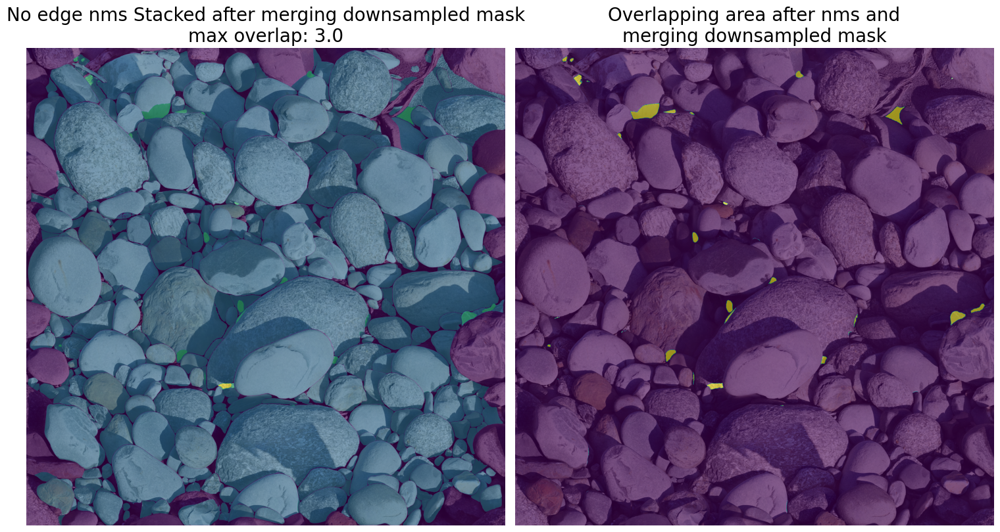

In [35]:
plt.figure(figsize=(15,10))
plt.subplot(1,2,1)
plt.imshow(image)
plt.imshow(np.sum(ar_masks,axis=0),alpha=0.6)
plt.axis('off')
plt.title(f'No edge nms Stacked after merging downsampled mask\nmax overlap: {np.max(np.sum(ar_masks,axis=0))}', fontsize=20)
plt.subplot(1,2,2)
plt.imshow(image)
plt.imshow(np.sum(ar_masks,axis=0)>1,alpha=0.6)
plt.axis('off')
plt.title('Overlapping area after nms and\nmerging downsampled mask', fontsize=20)
plt.tight_layout()
plt.show()

In [36]:
#saving mask
saving_void_filled=[]
for mask in ar_masks:
    saving_void_filled.append({'mask':mask})
np.save(OutDIR+'all_reseg_mask_void_filled',np.hstack(saving_void_filled))

In [24]:
#removing edge ids
for id in np.unique(np.hstack([np.unique(seg_ids[0,:]),np.unique(seg_ids[-1,:]),np.unique(seg_ids[:,0]),np.unique(seg_ids[:,-1])])):
    seg_ids[seg_ids==id]=-1

In [25]:
seg_labels=(np.unique(seg_ids)[1:])

seg_size=[]
for seg in seg_labels:
    seg_size.append(np.sum(seg_ids==seg))

seg_size_sort_idx=np.argsort(seg_size)

list_of_label=[(seg_ids==seg_labels[index]).astype(np.uint8) for index in seg_size_sort_idx]
list_of_label_centroid = [fnc.get_centroid(mask) for mask in list_of_label]
ar_label=np.stack(list_of_label)
del list_of_label

#ar_all=np.stack(list_of_label+Aggregate_masks_noedge_nms)
#list_of_centroid = [fnc.get_centroid(ar_all[i]) for i in range(len(ar_all))]

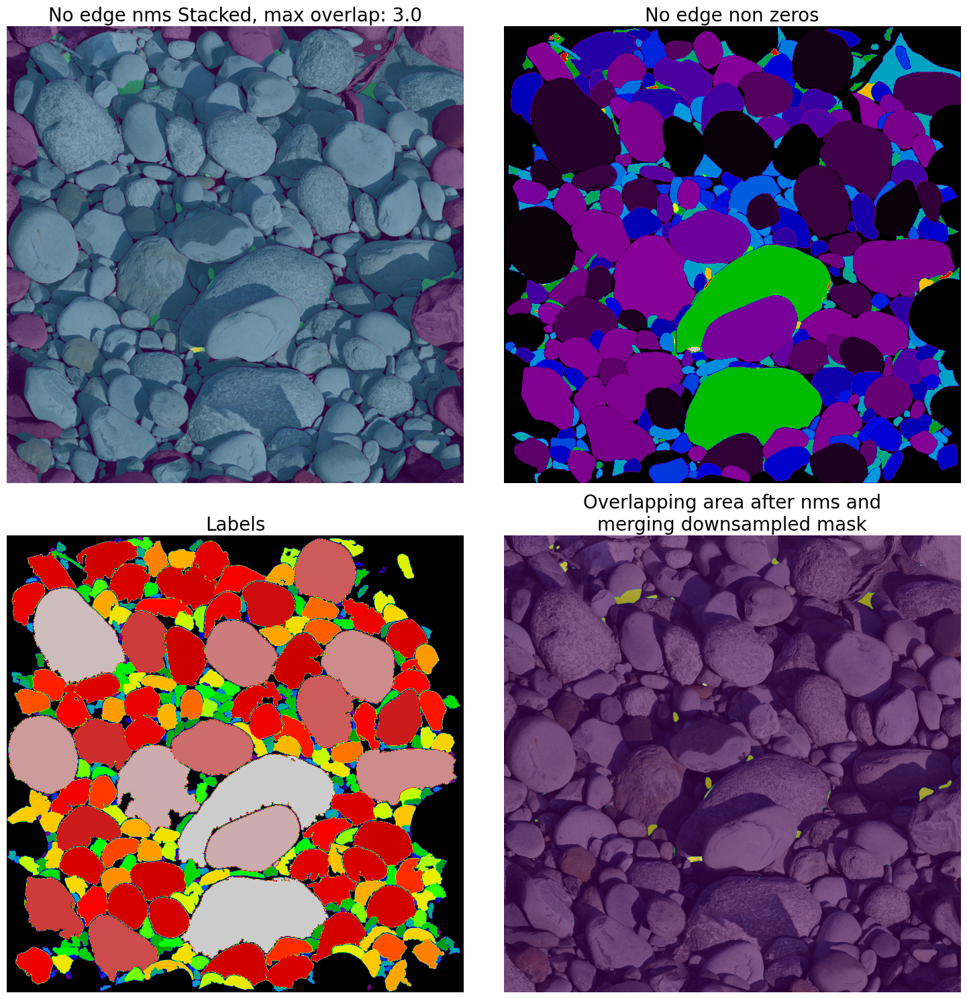

In [26]:
plt.figure(figsize=(15,15))
plt.subplot(2,2,1)
plt.imshow(image)
plt.imshow(np.sum(ar_masks,axis=0),alpha=0.6)
plt.axis('off')
plt.title(f'No edge nms Stacked, max overlap: {np.max(np.sum(ar_masks,axis=0))}', fontsize=20)

plt.subplot(2,2,2)
plt.imshow(image)
plt.imshow(np.sum([ar_masks[i]*(i+1) for i in range(ar_masks.shape[0])],axis=0), cmap='nipy_spectral')
plt.axis('off')
plt.title('No edge non zeros', fontsize=20)

plt.subplot(2,2,3)
plt.imshow(image)
plt.imshow(np.sum([ar_label[i]*(i+1) for i in range(ar_label.shape[0])],axis=0), cmap='nipy_spectral')
plt.axis('off')
plt.title('Labels', fontsize=20)

plt.subplot(2,2,4)
plt.imshow(image)
plt.imshow(np.sum(ar_masks,axis=0)>1,alpha=0.6)
plt.axis('off')
plt.title('Overlapping area after nms and\nmerging downsampled mask', fontsize=20)

plt.tight_layout()
plt.show()

In [27]:
uid_mask=np.sum([ar_masks[i]*(i+1) for i in range(ar_masks.shape[0])],axis=0)

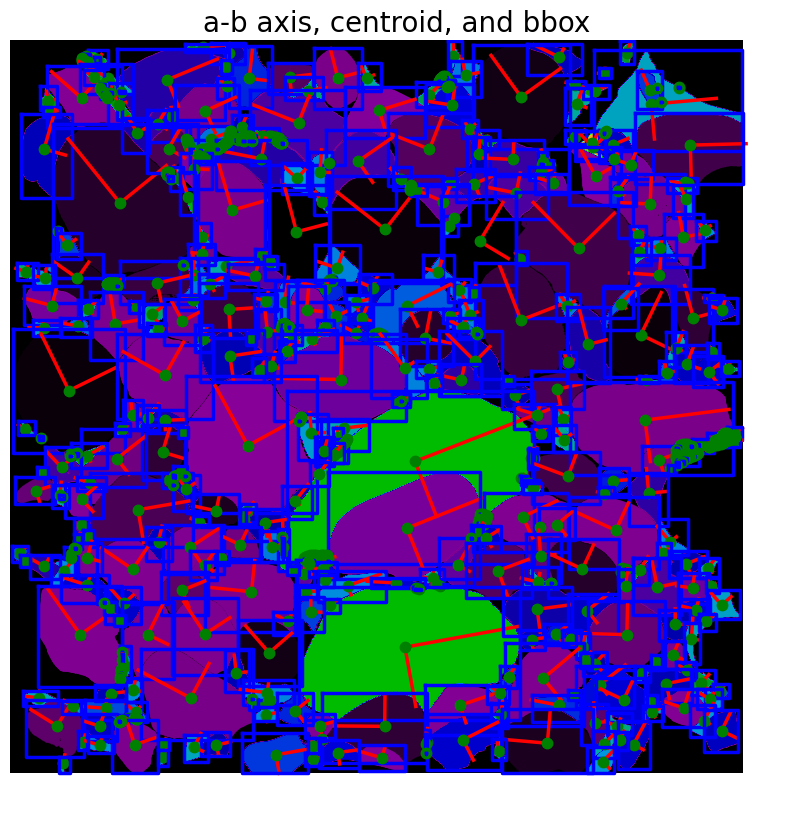

In [28]:
import math
label_img = label(uid_mask)
regions = regionprops(label_img)
fig, ax = plt.subplots(figsize=(10,10))
ax.imshow(uid_mask, cmap='nipy_spectral')
all_stats=[]

for i,props in enumerate(regions):
    y0, x0 = props.centroid
    orientation = props.orientation
    x1 = x0 + math.cos(orientation) * 0.5 * props.axis_minor_length
    y1 = y0 - math.sin(orientation) * 0.5 * props.axis_minor_length
    x2 = x0 - math.sin(orientation) * 0.5 * props.axis_major_length
    y2 = y0 - math.cos(orientation) * 0.5 * props.axis_major_length
    all_stats.append({'label':i,'area':props.area
                      ,'centroid y':y0,'centroid x':x0
                      , 'major axis length': props.axis_major_length
                      , 'minor axis length': props.axis_minor_length
                      , 'orientation': orientation
                      , 'perimeter': props.perimeter
                      , 'bbox':props.bbox})

    ax.plot((x0, x1), (y0, y1), '-r', linewidth=2.5)
    ax.plot((x0, x2), (y0, y2), '-r', linewidth=2.5)
    ax.plot(x0, y0, '.g', markersize=15)

    minr, minc, maxr, maxc = props.bbox
    bx = (minc, maxc, maxc, minc, minc)
    by = (minr, minr, maxr, maxr, minr)
    ax.plot(bx, by, '-b', linewidth=2.5)


ax.axis('off')
plt.title('a-b axis, centroid, and bbox', fontsize=20)
plt.show()

stats_df=pd.DataFrame(all_stats)
del all_stats

In [118]:
stats_df.to_hdf(OutDIR+'stats_df.h5', key='df', mode='w')

/tmp/ipykernel_1471429/3920363142.py:1: PerformanceWarning: 
your performance may suffer as PyTables will pickle object types that it cannot
map directly to c-types [inferred_type->mixed,key->block2_values] [items->Index(['bbox'], dtype='object')]

  stats_df.to_hdf(OutDIR+'stats_df.h5', key='df', mode='w')


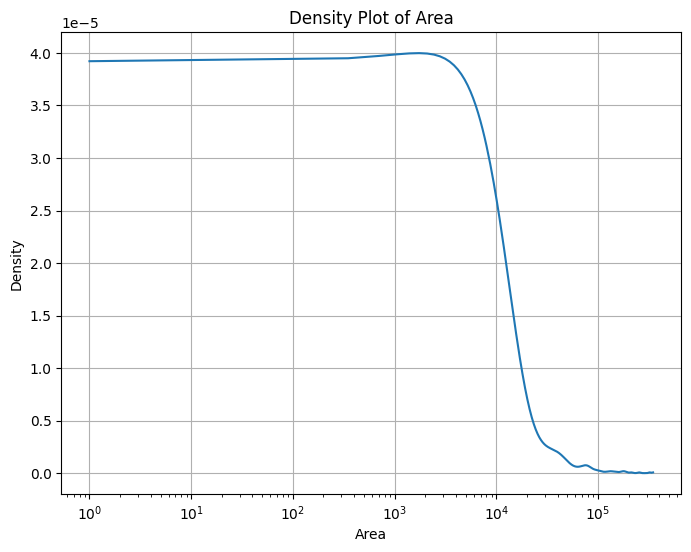

In [29]:
from scipy.stats import gaussian_kde
loged = True  # Set this according to your needs

# Extract data from DataFrame
data = stats_df['area']

# Create a kernel density estimate
kde = gaussian_kde(data)

# Set up the x-axis for the KDE plot
x = np.linspace(min(data), max(data), 1000)

# Calculate the KDE values for the x-axis
kde_values = kde(x)

plt.figure(figsize=(8, 6))

if loged:
    plt.xscale('log')

# Plot the KDE curve
plt.plot(x, kde_values)

plt.xlabel('Area')
plt.ylabel('Density')
plt.title('Density Plot of Area')
plt.grid()

plt.show()

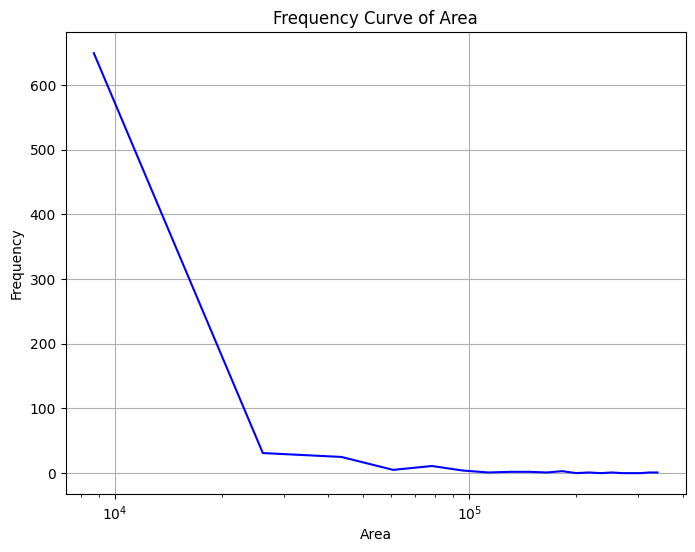

In [30]:
# Assume stats_df is your DataFrame and 'area' is the column you're plotting
loged = True  # Set this according to your needs

# Extract data from DataFrame
data = stats_df['area']

# Compute the histogram (frequencies and bin edges)
frequencies, bin_edges = np.histogram(data, bins=20)

# Calculate the midpoints of each bin
bin_midpoints = (bin_edges[:-1] + bin_edges[1:]) / 2

plt.figure(figsize=(8, 6))

if loged:
    plt.xscale('log')
    #plt.yscale('log')

# Plot the frequency curve
plt.plot(bin_midpoints, frequencies, linestyle='-', color='blue')

plt.xlabel('Area')
plt.ylabel('Frequency')
plt.title('Frequency Curve of Area')
plt.grid()

plt.show()

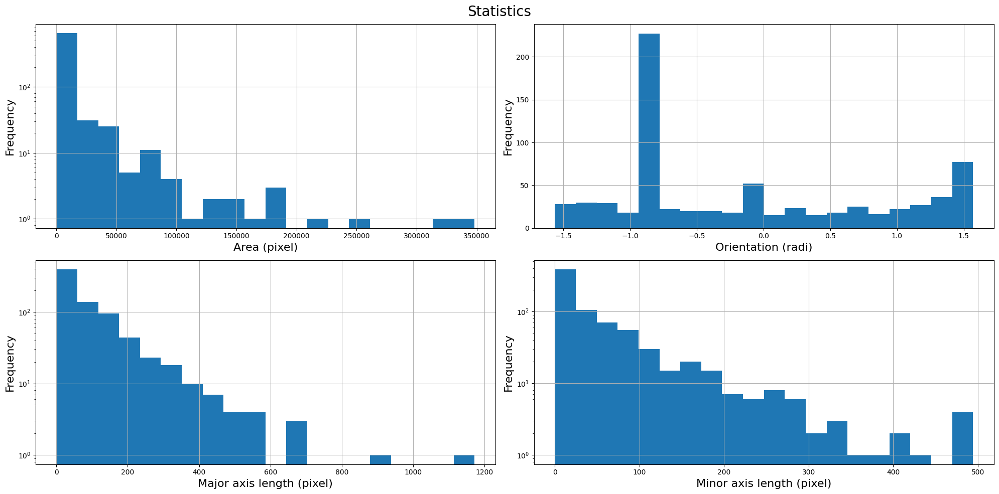

In [31]:
loged=True
plt.figure(figsize=(20,10))

plt.subplot(2,2,1)
plt.hist(stats_df['area'], log=loged, bins=20)
plt.xlabel('Area (pixel)',fontsize=16)
plt.ylabel('Frequency',fontsize=16)
plt.grid()
plt.subplot(2,2,2)
plt.hist(stats_df['orientation'], bins=20)
plt.xlabel('Orientation (radi)',fontsize=16)
plt.ylabel('Frequency',fontsize=16)
plt.grid()
plt.subplot(2,2,3)
plt.hist(stats_df['major axis length'], log=loged, bins=20)
plt.xlabel('Major axis length (pixel)',fontsize=16)
plt.ylabel('Frequency',fontsize=16)
plt.grid()
plt.subplot(2,2,4)
plt.hist(stats_df['minor axis length'], log=loged, bins=20)
plt.xlabel('Minor axis length (pixel)',fontsize=16)
plt.ylabel('Frequency',fontsize=16)
plt.grid()
plt.suptitle('Statistics',fontsize=20)
plt.tight_layout()
plt.show()

In [32]:
tree = KDTree(list_of_label_centroid+list_of_mask_centroid)              
k=6
_, ind = tree.query(list_of_label_centroid, k=k)

# get nearest centroid iou
kdc_iou=[]
nearest_mask_pick=[]
labelcount=ar_label.shape[0]
for match in ind:
    #check if nearest neighbor is not a label
    j=1
    while match[j]<labelcount:
        j+=1
        if j==k:
            break
    if j<k:
        if np.sum(ar_label[match[0]])>np.sum(ar_masks[match[j]-labelcount]):
            kdc_iou.append(-fnc.iou(ar_label[match[0]],ar_masks[match[j]-labelcount]))
            nearest_mask_pick.append(match[j])
        else:
            kdc_iou.append(fnc.iou(ar_label[match[0]],ar_masks[match[j]-labelcount]))
            nearest_mask_pick.append(match[j])
    else:
        kdc_iou.append(-0.1)
        nearest_mask_pick.append(0)

In [33]:
ar_label.shape[0]

364

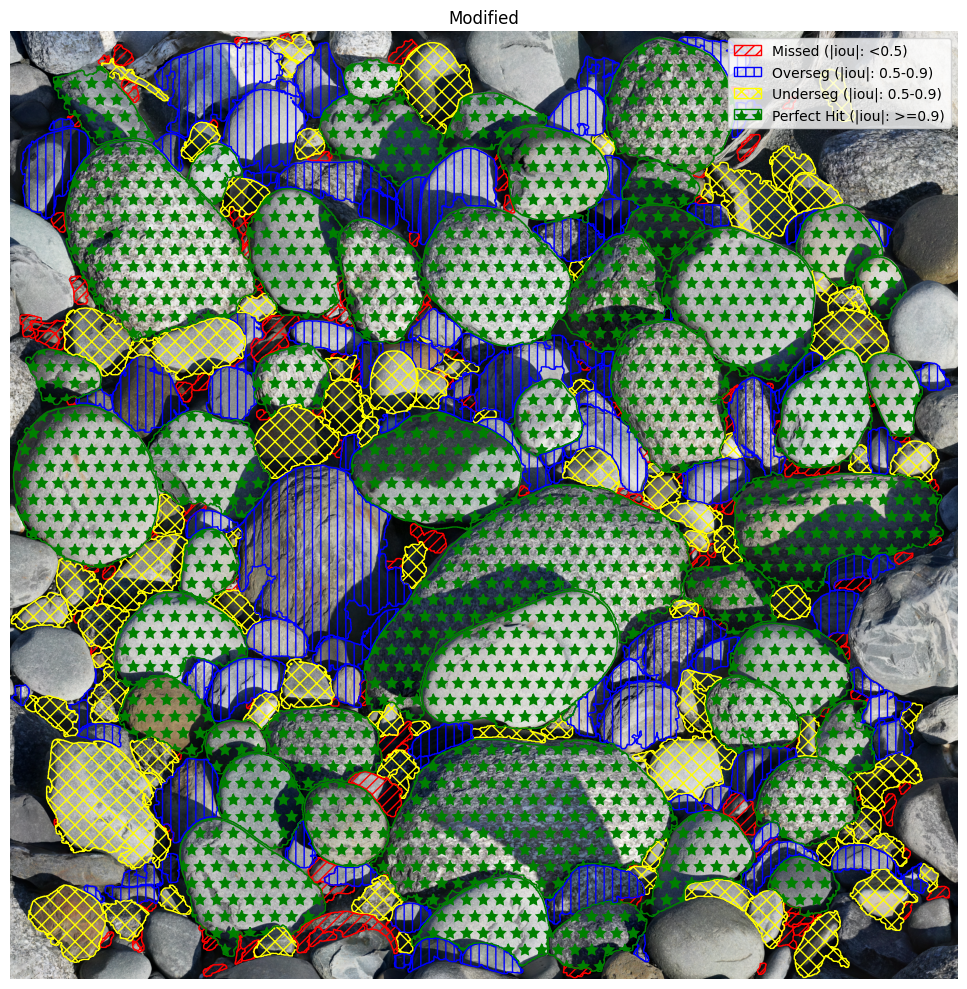

In [34]:
fig,ax=plt.subplots(figsize=(12,10))
ax.imshow(image)

for i in range(ar_label.shape[0]):
    contours = plt.contour(ar_label[i], levels=[0.5], colors='none')

    for contour_path in contours.collections[0].get_paths():
        # hatch option 	{'/', '\', '|', '-', '+', 'x', 'o', 'O', '.', '*'}
        msk_iou=kdc_iou[i]
        if abs(msk_iou)<0.5:#missed
            patch = patches.PathPatch(contour_path, hatch='///', fill=False, edgecolor='red')
        elif (abs(msk_iou)>=0.5 and abs(msk_iou)<0.9):#hit but not perfect
            if msk_iou>0:#overseg
                patch = patches.PathPatch(contour_path, hatch='||', fill=False, edgecolor='blue')
            elif msk_iou<0:#underseg
                patch = patches.PathPatch(contour_path, hatch='xx', fill=False, edgecolor='yellow')
        else:
            patch = patches.PathPatch(contour_path, hatch='*', fill=False, edgecolor='green')
        ax.add_patch(patch)

legend_patches = [
    patches.Patch(facecolor='none', hatch='///', edgecolor='red', label='Missed (|iou|: <0.5)'),
    patches.Patch(facecolor='none', hatch='||', edgecolor='blue', label='Overseg (|iou|: 0.5-0.9)'),
    patches.Patch(facecolor='none', hatch='xx', edgecolor='yellow', label='Underseg (|iou|: 0.5-0.9)'),
    patches.Patch(facecolor='none', hatch='*', edgecolor='green', label='Perfect Hit (|iou|: >=0.9)')
]
ax.legend(handles=legend_patches, loc='upper right')

plt.axis('off')
plt.title('Modified')
plt.tight_layout()

plt.show()

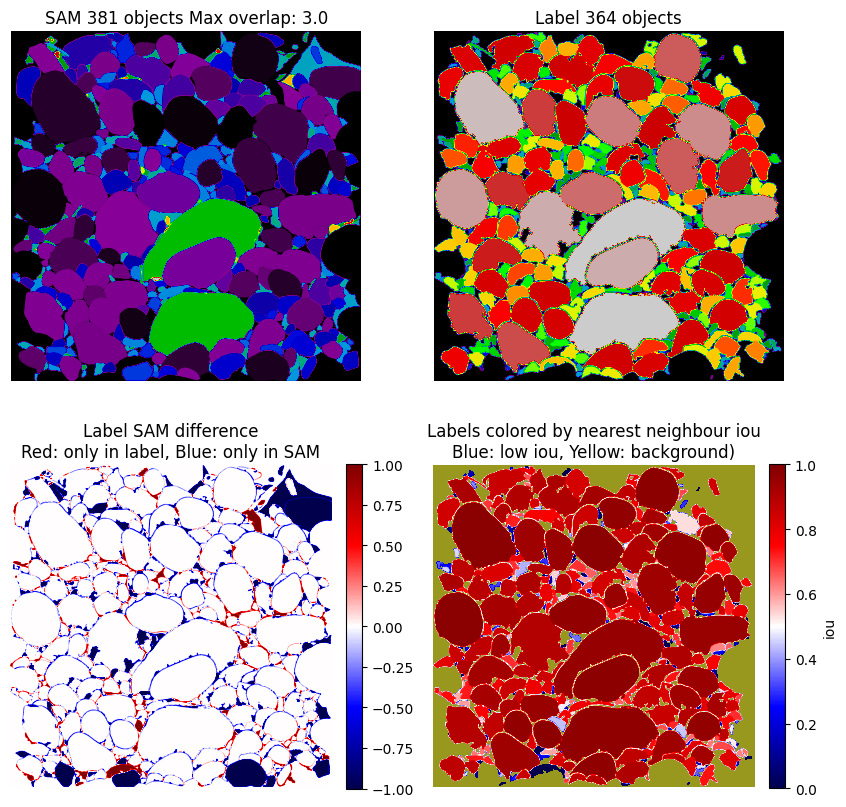

In [51]:
plt.figure(figsize=(10,10))
plt.subplot(2,2,1)
plt.imshow(np.sum([ar_masks[i]*(i+1) for i in range(ar_masks.shape[0])],axis=0), cmap='nipy_spectral')
plt.title(f'SAM {ar_masks.shape[0]} objects Max overlap: {np.max(np.sum(ar_masks,axis=0))}')
plt.axis('off')
plt.subplot(2,2,2)
plt.imshow(np.sum([ar_label[i]*(i+1) for i in range(labelcount)],axis=0), cmap='nipy_spectral')
plt.title(f'Label {labelcount} objects')
plt.axis('off')
plt.subplot(2,2,3)
plt.imshow(np.sum(ar_label,axis=0).astype(np.int64)-np.sum(ar_masks,axis=0).astype(np.int64),cmap='seismic',vmax=1,vmin=-1)
plt.colorbar(fraction=0.046, pad=0.04)
plt.title('Label SAM difference\nRed: only in label, Blue: only in SAM')
plt.axis('off')

plt.subplot(2,2,4)
ar_label_iou=ar_label.copy().astype(np.float64)
for i,x in enumerate(kdc_iou):
    ar_label_iou[i]=ar_label[i]*x

mask = np.isclose(np.sum(ar_label,axis=0),0)
plt.imshow(np.abs(np.sum(ar_label_iou,axis=0)), cmap='seismic',vmax=1,vmin=0)
plt.colorbar(label='iou',fraction=0.046, pad=0.04)
cmap = mcolors.ListedColormap(['none', 'yellow'])
plt.imshow(mask, cmap=cmap, alpha=0.6)
plt.axis('off')
plt.title('Labels colored by nearest neighbour iou\nBlue: low iou, Yellow: background)')
plt.show()

In [55]:
nearest_centroid_distance=[]
for i in range(labelcount):
    if nearest_mask_pick[i]!=0:
        x0,y0=list_of_label_centroid[i]#label centroid
        x1,y1=list_of_mask_centroid[nearest_mask_pick[i]-labelcount]
        nearest_centroid_distance.append(np.sqrt((x0-x1)**2+(y0-y1)**2))
    else:
        nearest_centroid_distance.append(np.nan)
        print('one nan')

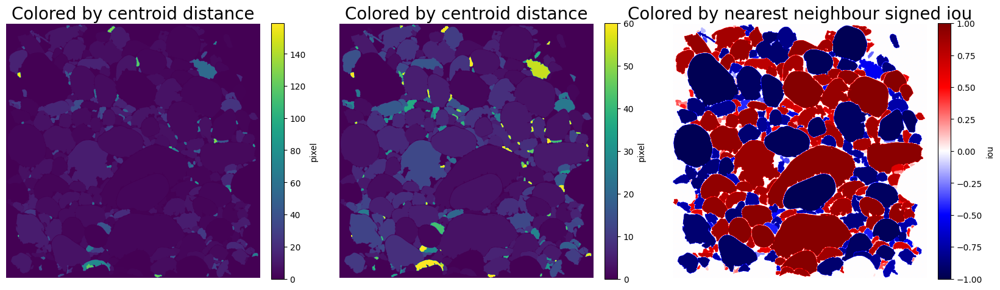

In [56]:
plt.figure(figsize=(20,15))
plt.subplot(1,3,1)
ar_label_dist=ar_label.copy()
for i,x in enumerate(nearest_centroid_distance):
    if not np.isnan(x):
        ar_label_dist[i]=ar_label_dist[i]*x
    else:
        ar_label_dist[i]=ar_label_dist[i]*(-9999)
plt.imshow(np.sum(ar_label_dist,axis=0),vmin=0)
plt.colorbar(label='pixel',fraction=0.046, pad=0.04)
cmap = mcolors.ListedColormap(['none', 'red'])
mask = np.isclose(np.sum(ar_label,axis=0),-9999)
plt.imshow(mask, cmap=cmap)
plt.axis('off')
plt.title('Colored by centroid distance', fontsize=20)

plt.subplot(1,3,2)
plt.imshow(np.sum(ar_label_dist,axis=0),vmax=60)
plt.colorbar(label='pixel',fraction=0.046, pad=0.04)
cmap = mcolors.ListedColormap(['none', 'red'])
mask = np.isclose(np.sum(ar_label,axis=0),-9999)
plt.imshow(mask, cmap=cmap)
plt.axis('off')
plt.title('Colored by centroid distance', fontsize=20)
del ar_label_dist

plt.subplot(1,3,3)
ar_label_iou=ar_label.copy().astype(np.float64)
for i,x in enumerate(kdc_iou):
    ar_label_iou[i]=ar_label[i]*x
plt.imshow(np.sum(ar_label_iou,axis=0), cmap='seismic',vmax=1,vmin=-1)
plt.colorbar(label='iou',fraction=0.046, pad=0.04)
plt.axis('off')
plt.title('Colored by nearest neighbour signed iou', fontsize=20)
plt.show()

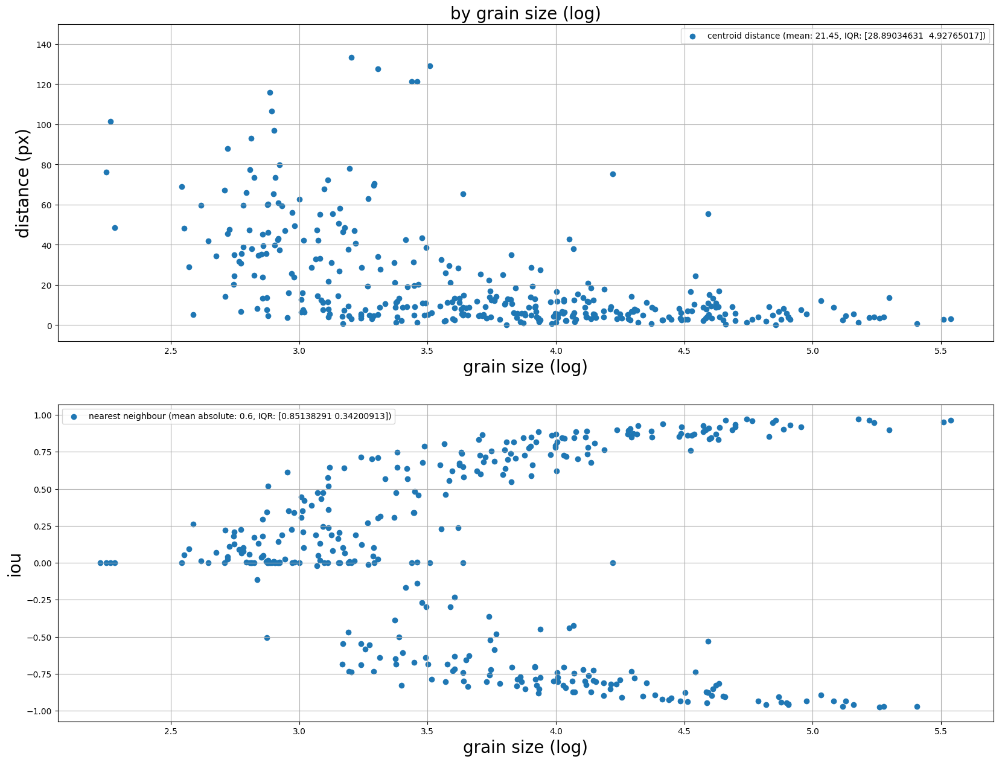

In [63]:
kdc_iou=np.array(kdc_iou)
sizes=np.log10([seg_size[i] for i in seg_size_sort_idx])

fig,ax=plt.subplots(2,1,figsize=(20,15))
ax=ax.flatten()
ax[0].scatter(sizes,np.array(nearest_centroid_distance),label=f'centroid distance (mean: {np.nanmean(nearest_centroid_distance):.2f}, IQR: {np.percentile(nearest_centroid_distance, [75, 25])})')
ax[0].set_ylim(top=150)
ax[0].set_xlabel('grain size (log)', fontsize=20)
ax[0].set_ylabel('distance (px)', fontsize=20)
ax[0].grid()
ax[0].legend()
ax[1].scatter(sizes,kdc_iou,label=f'nearest neighbour (mean absolute: {round(np.mean(np.abs(kdc_iou[kdc_iou!=0])),2)}, IQR: {(np.percentile(np.abs(kdc_iou[kdc_iou!=0]), [75, 25]))})')
ax[1].set_xlabel('grain size (log)', fontsize=20)
ax[1].set_ylabel('iou', fontsize=20)
ax[1].grid()
ax[1].legend()
ax[0].set_title('by grain size (log)', fontsize=20)
plt.show()

In [40]:
#clip

model_list=clip.available_models()
print('Available clip models:')
for i, M in enumerate(model_list):
    print(f'{i}:' + M)
print("---------------")

Available clip models:
0:RN50
1:RN101
2:RN50x4
3:RN50x16
4:RN50x64
5:ViT-B/32
6:ViT-B/16
7:ViT-L/14
8:ViT-L/14@336px
---------------


In [41]:
#model_select=int(input("Select a model: "))
model_select=7
model, preprocess = clip.load(model_list[model_select], device=DEVICE)
print(model_list[model_select]+' loaded')

ViT-L/14 loaded


In [42]:
kmean_mask=np.array(np.reshape(cluster_labels,(crop_size,crop_size)) == 0)
kmean_masked_img=cropped_image.copy()
kmean_masked_img[kmean_mask==0]=0

NameError: name 'cluster_labels' is not defined

In [ ]:
labels_LSet01=["an aerial photo of a stone", "an aerial photo of a small pebble stone"
        , "an aerial photo of a piece of sand surface"
        , "an aerial photo of some green plants", "dead bush"
        , "an aerial photo of a shrub","an irregular green object", "a top-down photo of a bush", "an aerial photo of a bush"
        , "a top-down photo of a shrub", "an aerial photo of some bushes", "wood stick", "wood branch"
        , "an aerial photo of desert surface", "an aerial photo of a sandy ground"
        , "a photo of the top of a bush", "an aerial photo of a small bush"]

In [ ]:
labels_LSet01=["a photo of a stone", "a photo of a wood stick","wood branch"]

In [43]:
##label top

kmean_apply=False
WithBackground=False
BG='White'
#BG='Black

if (not WithBackground) or kmean_apply:
    if BG=='White':
        fill_value=255
    else:
        fill_value=0

#load image
pil_image = Image.fromarray(image)
numpy_array = np.array(pil_image)
if kmean_apply:
    numpy_array[kmean_mask==0]=fill_value

#define possible labels
labels=["a photo of a stone", "a photo of a wood stick","wood branch"]
text = clip.tokenize(labels).to(DEVICE)

#output
most_probables = []
probabilities = []
clip_probability_mask=np.zeros(image.shape[:-1])
    
#run prediction
for sg in tqdm(range(ar_masks.shape[0]), desc='Processing', unit='segment'):
    sg_mask=ar_masks[sg]
    
    #cropping
    notzero_indices = np.nonzero(sg_mask)
    if notzero_indices[0].shape[0]>10:
        x_min = np.min(notzero_indices[0]).astype(int)
        x_max = np.max(notzero_indices[0]).astype(int)
        y_min = np.min(notzero_indices[1]).astype(int)
        y_max = np.max(notzero_indices[1]).astype(int)
        if WithBackground:
            clip_masked_image=numpy_array[x_min-5:x_max+5, y_min-5:y_max+5,:]
        else:
            #masking
            masked_image = np.copy(numpy_array)
            masked_image[sg_mask == 0] = fill_value
            clip_masked_image=masked_image[x_min-5:x_max+5, y_min-5:y_max+5,:]

        #convert back to PIL
        if ((clip_masked_image.shape[0]!=0)&(clip_masked_image.shape[1]!=0)):
            preprocessed_pil_image = Image.fromarray(clip_masked_image)

            #predict
            pre_image = preprocess(preprocessed_pil_image).unsqueeze(0).to(DEVICE)
            most_porbable, probability = fnc.classify_and_return_notable(pre_image, text, labels, model)
            most_probables.append(int(most_porbable))
            probabilities.append(probability)
            
            if int(most_porbable)<=1:
                clip_probability_mask[sg_mask!=0]=probability
        else:
            most_probables.append(np.nan)
            probabilities.append(np.nan)

Processing:   0%|          | 0/228 [00:00<?, ?segment/s]

/DATA/vito/.venv/lib/python3.8/site-packages/torch/nn/modules/conv.py:456: UserWarning: Plan failed with a cudnnException: CUDNN_BACKEND_EXECUTION_PLAN_DESCRIPTOR: cudnnFinalize Descriptor Failed cudnn_status: CUDNN_STATUS_NOT_SUPPORTED (Triggered internally at ../aten/src/ATen/native/cudnn/Conv_v8.cpp:919.)
  return F.conv2d(input, weight, bias, self.stride,
Processing: 100%|██████████| 228/228 [00:19<00:00, 11.85segment/s]


In [44]:
non_rocks_mask=[ar_masks[i] for i in range(ar_masks.shape[0]) if most_probables[i]!=0]

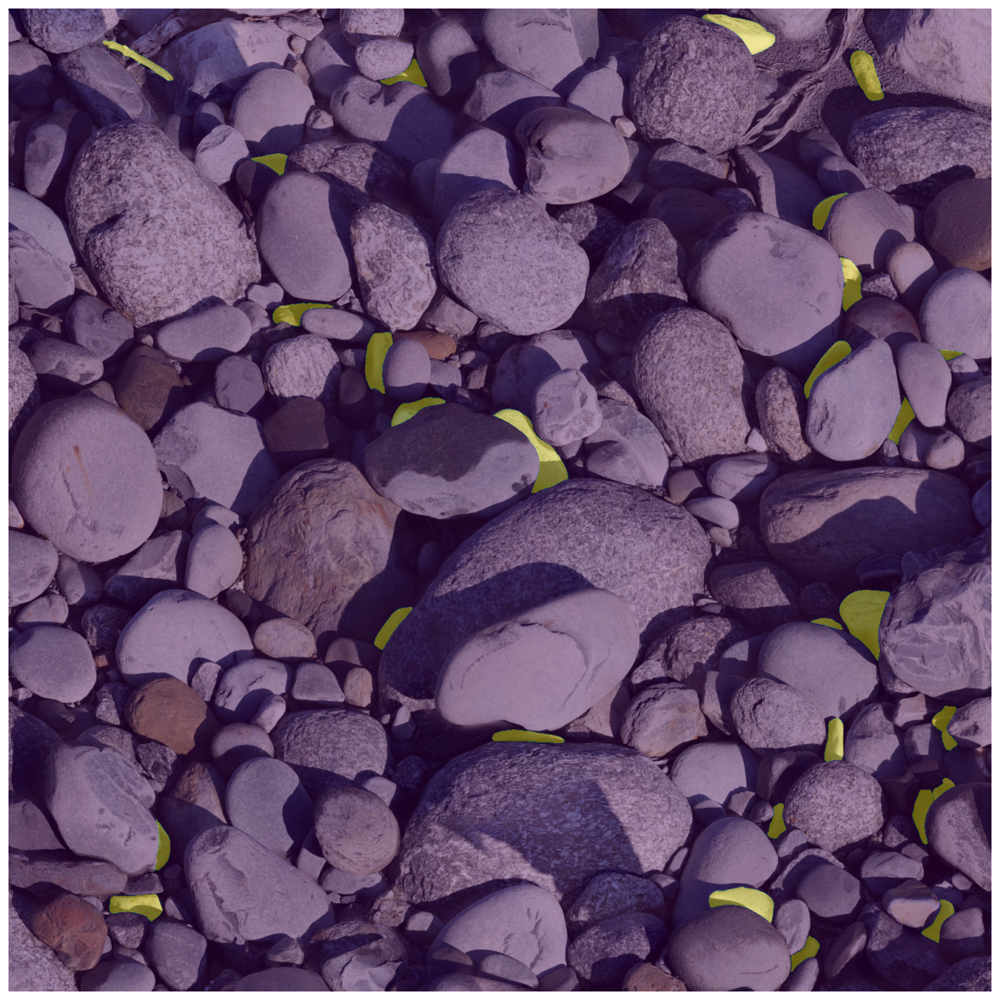

In [45]:
plt.figure(figsize=(15,15))
plt.imshow(image)
plt.imshow(np.sum(non_rocks_mask,axis=0),alpha=0.4)
plt.axis('off')
plt.show()

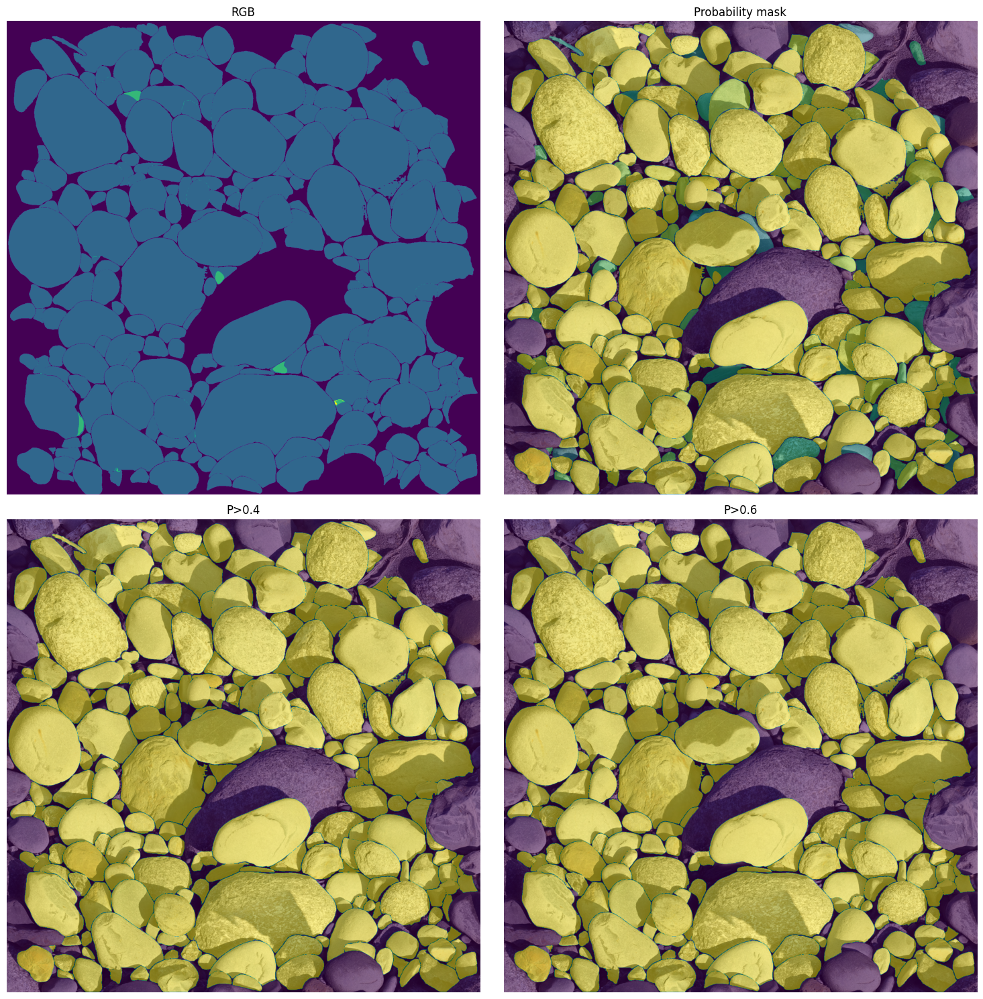

In [46]:
fnc.clip_plotting_array(image,clip_probability_mask, ar_masks,0.4,0.6)